# Used Cars Dataset
## Vehicles listings from Craigslist.org

- https://www.kaggle.com/austinreese/craigslist-carstrucks-data#

In [1]:
%matplotlib inline

import pandas as pd
from pandas.api.types import is_string_dtype, is_numeric_dtype, is_categorical_dtype

import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import train_test_split


from sklearn.tree import export_graphviz
from IPython.display import Image
from subprocess import call

import os
import seaborn as sns
import matplotlib.pyplot as plt
sns.set(rc={'figure.figsize':(13,6)})


In [2]:
df = pd.read_csv("62920_1254870_bundle_archive.zip")
df.tail().T

,435844,435845,435846,435847,435848
id,7119262300,7112219717,7120896708,7120885819,7112215161
url,https://mohave.craigslist.org/cto/d/hualapai-2...,https://rapidcity.craigslist.org/cto/d/rapid-c...,https://oregoncoast.craigslist.org/cto/d/corne...,https://oregoncoast.craigslist.org/ctd/d/portl...,https://rapidcity.craigslist.org/ctd/d/rapid-c...
region,mohave county,rapid city / west SD,oregon coast,oregon coast,rapid city / west SD
region_url,https://mohave.craigslist.org,https://rapidcity.craigslist.org,https://oregoncoast.craigslist.org,https://oregoncoast.craigslist.org,https://rapidcity.craigslist.org
price,2500,2700,2450,8995,6577
year,2005,2002,2001,2013,2010
manufacturer,ford,toyota,ford,mazda,dodge
model,f150,camry,focus,mazda3,grand caravan
condition,fair,good,good,NaN,NaN
cylinders,NaN,6 cylinders,4 cylinders,NaN,NaN


<AxesSubplot:xlabel='price'>

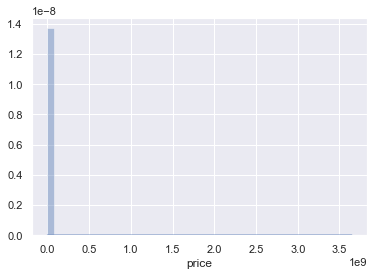

In [3]:
sns.distplot(df["price"])

_Data has too much variation - ranging from to almost $3.6 Billion resulting in a right skewed plot. A summary statistics of the price column will reveal this discrepency in price range_

In [4]:
df["price"].describe()

count    4.358490e+05
mean     1.349127e+05
std      1.690857e+07
min      0.000000e+00
25%      4.900000e+03
50%      9.995000e+03
75%      1.798900e+04
max      3.647257e+09
Name: price, dtype: float64

_Applying a log transformation on the data will help us understand where most of the data is distributed_

<AxesSubplot:xlabel='price'>

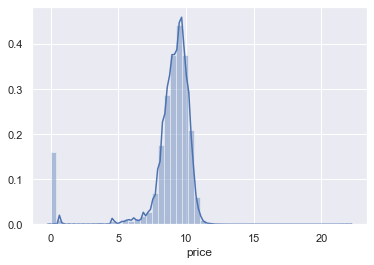

In [5]:
sns.distplot(np.log1p(df["price"]))

In [6]:
f"Most of the data lies between ${int(np.exp(7))} and ${int(np.exp(11))}"

'Most of the data lies between $1096 and $59874'

In [7]:
# Clip the sale data to its 10st and 99th percentile values

lower_perc, higher_perc = np.percentile(df["price"], [10, 99])

f"10th %ile is ${lower_perc} and 99th% ile $ {higher_perc}"

'10th %ile is $1000.0 and 99th% ile $ 53566.0'

_We can either clip our data frame based on the logarithmic graph or percentile values. Since the chosen percentile are closer to the logarithmic graph, we'll pick the percentile values_

In [8]:
df = df[(df["price"] >= lower_perc) & (df["price"] <= higher_perc) ]

<AxesSubplot:xlabel='price'>

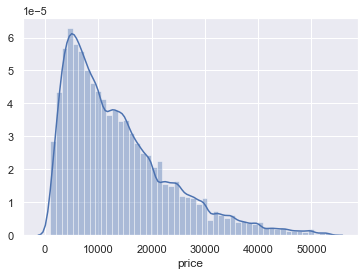

In [9]:
sns.distplot(df["price"])

<AxesSubplot:xlabel='price'>

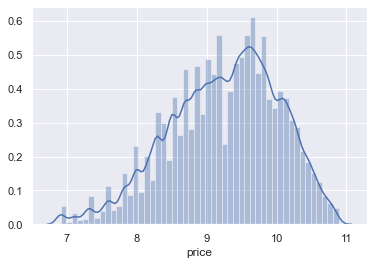

In [10]:
sns.distplot(np.log1p(df["price"]))

In [11]:
df.shape

(389023, 25)

## Baseline Model

In [12]:
df.columns

Index(['id', 'url', 'region', 'region_url', 'price', 'year', 'manufacturer',
       'model', 'condition', 'cylinders', 'fuel', 'odometer', 'title_status',
       'transmission', 'vin', 'drive', 'size', 'type', 'paint_color',
       'image_url', 'description', 'county', 'state', 'lat', 'long'],
      dtype='object')

#### % of rows with Missing values

In [13]:
round(df.isna().sum(axis = 0) * 100/len(df))

id                0.0
url               0.0
region            0.0
region_url        0.0
price             0.0
year              0.0
manufacturer      4.0
model             1.0
condition        40.0
cylinders        37.0
fuel              1.0
odometer         16.0
title_status      0.0
transmission      0.0
vin              45.0
drive            27.0
size             68.0
type             26.0
paint_color      30.0
image_url         0.0
description       0.0
county          100.0
state             0.0
lat               1.0
long              1.0
dtype: float64

_Remove fields with too many missing values and thise which doesn't contribute to the target variable_

In [14]:
baseline_features = df.drop(columns = ["id", "url", "region_url", "vin", "image_url", "description", "county", "price"])
target_feature = df["price"]

In [15]:
def encode_cats(df):
    encoded_dictionary = {}
    for n,c in df.items(): 
        #Iterate over (column name, Series) pairs.
        if is_numeric_dtype(c):
            median = np.median(c[pd.notnull(c)])
            print(f"median of {n} is {median}")
            df.loc[c.isnull(), n] = median
        if is_string_dtype(c): 
            #If the column is a string column, convert it to a Categorical values
            c = pd.Categorical(c)
        if is_categorical_dtype(c): 
            # When the column is converted to categorical column, 
            # Save the category names to a dictionary and substitute it with its numerical code
            encoded_dictionary[n] = {item : i for i, item in enumerate(c.categories)}
            df.loc[:,n] = c.codes
    return encoded_dictionary

In [16]:
encoded_dictionary = encode_cats(baseline_features)


median of year is 2012.0
median of odometer is 93954.5
median of lat is 39.0545
median of long is -89.3971


In [17]:
encoded_dictionary.keys()

dict_keys(['region', 'manufacturer', 'model', 'condition', 'cylinders', 'fuel', 'title_status', 'transmission', 'drive', 'size', 'type', 'paint_color', 'state'])

In [18]:
encoded_dictionary["manufacturer"]

{'acura': 0,
 'alfa-romeo': 1,
 'aston-martin': 2,
 'audi': 3,
 'bmw': 4,
 'buick': 5,
 'cadillac': 6,
 'chevrolet': 7,
 'chrysler': 8,
 'datsun': 9,
 'dodge': 10,
 'ferrari': 11,
 'fiat': 12,
 'ford': 13,
 'gmc': 14,
 'harley-davidson': 15,
 'honda': 16,
 'hyundai': 17,
 'infiniti': 18,
 'jaguar': 19,
 'jeep': 20,
 'kia': 21,
 'land rover': 22,
 'lexus': 23,
 'lincoln': 24,
 'mazda': 25,
 'mercedes-benz': 26,
 'mercury': 27,
 'mini': 28,
 'mitsubishi': 29,
 'morgan': 30,
 'nissan': 31,
 'pontiac': 32,
 'porche': 33,
 'ram': 34,
 'rover': 35,
 'saturn': 36,
 'subaru': 37,
 'tesla': 38,
 'toyota': 39,
 'volkswagen': 40,
 'volvo': 41}

In [19]:
encoded_dictionary["fuel"]

{'diesel': 0, 'electric': 1, 'gas': 2, 'hybrid': 3, 'other': 4}

In [20]:
encoded_dictionary["drive"]

{'4wd': 0, 'fwd': 1, 'rwd': 2}

In [21]:
baseline_features.tail().T

,435844,435845,435846,435847,435848
region,221.0000,283.0000,259.0000,259.0000,283.0000
year,2005.0000,2002.0000,2001.0000,2013.0000,2010.0000
manufacturer,13.0000,39.0000,13.0000,25.0000,10.0000
model,16256.0000,10760.0000,17438.0000,21085.0000,18576.0000
condition,1.0000,2.0000,2.0000,-1.0000,-1.0000
cylinders,-1.0000,5.0000,3.0000,-1.0000,-1.0000
fuel,2.0000,2.0000,2.0000,2.0000,2.0000
odometer,282866.0000,194000.0000,130484.0000,93339.0000,148721.0000
title_status,0.0000,0.0000,0.0000,0.0000,0.0000
transmission,0.0000,0.0000,0.0000,0.0000,0.0000


In [22]:
X_train, X_valid, y_train, y_valid = train_test_split(baseline_features, target_feature)


In [23]:
X_train.shape, y_train.shape, X_valid.shape, y_valid.shape


((291767, 17), (291767,), (97256, 17), (97256,))

In [24]:

def rmse(x,y): 
    return np.sqrt(((x-y)**2).mean())

def print_score(m):
    res = f"""
    Train RMS : {rmse(m.predict(X_train), y_train)}, 
    Valid RMSE : {rmse(m.predict(X_valid), y_valid)},
    Train R2 score : {m.score(X_train, y_train)}, 
    Valid R2 score: {m.score(X_valid, y_valid)}
    """
    print(res)

In [25]:

def draw_tree(m, tree_index = 1,rotate = True,max_depth = 4,):
    
    if type(m) == DecisionTreeRegressor:
        estimator = m
    else:
        estimator = m.estimators_[tree_index]
    
    if not os.path.exists("tree"):
        os.mkdir("tree")
    # Export as dot file
    export_graphviz(estimator, out_file='tree/tree.dot', 
                    feature_names = X_train.columns,
                    rounded = True, proportion = False, 
                    rotate = rotate,
                    max_depth = max_depth,
                    precision = 0, filled = True)
    
    # Convert to png using system command (requires Graphviz)
    call(['dot', '-Tpng', 'tree/tree.dot', '-o', 'tree/tree.png', '-Gdpi=600'])

    # Display in jupyter notebook
    return Image(filename = 'tree/tree.png')

In [54]:

dt = DecisionTreeRegressor()
%time dt.fit(X_train, y_train)
print_score(dt)

CPU times: user 4.24 s, sys: 8.06 ms, total: 4.24 s
Wall time: 4.24 s

    Train RMS : 170.1259768403457, 
    Valid RMSE : 4728.628277673284,
    Train R2 score : 0.9996995069110131, 
    Valid R2 score: 0.7674176995356841
    


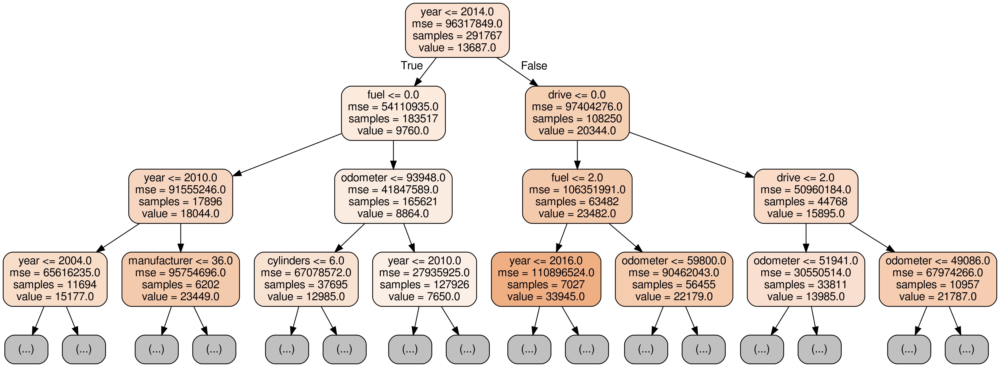

In [52]:
draw_tree(dt, rotate=False, max_depth= 3)

In [37]:
type(dt) == DecisionTreeRegressor

True

In [62]:
# Run base model 

m1 = RandomForestRegressor(n_jobs=-1, n_estimators=10)
%time m1.fit(X_train, y_train)
print_score(m1)

CPU times: user 38.2 s, sys: 95.8 ms, total: 38.2 s
Wall time: 11.1 s

    Train RMS : 1544.3741913771357, 
    Valid RMSE : 3548.3079078628084,
    Train R2 score : 0.9752372829577286, 
    Valid R2 score: 0.8690369110443474
    


In [64]:
type(m1) == RandomForestRegressor

True

In [56]:
draw_tree(m1, 2)

In [61]:
m2 = RandomForestRegressor(n_jobs=-1, n_estimators=40)
%time m2.fit(X_train, y_train)
print_score(m2)


CPU times: user 2min 51s, sys: 273 ms, total: 2min 52s
Wall time: 44.6 s

    Train RMS : 1324.4154025275413, 
    Valid RMSE : 3372.801418061279,
    Train R2 score : 0.9817886697519653, 
    Valid R2 score: 0.8816719097398693
    


## Hyperparameter tunining

In [59]:
from pprint import pprint
# Look at parameters used by our current forest
print('Parameters currently in use:\n')
pprint(m2.get_params())


Parameters currently in use:

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'criterion': 'mse',
 'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 40,
 'n_jobs': -1,
 'oob_score': False,
 'random_state': None,
 'verbose': True,
 'warm_start': False}


In [70]:
from sklearn.model_selection import RandomizedSearchCV
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 40, stop = 120, num = 11)]

# Number of features to consider at every split
max_features = ['auto', 'sqrt']

# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]

# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]

# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 3, 5, 7, 9]


# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}
pprint(random_grid)

{'bootstrap': [True, False],
 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110],
 'max_features': ['auto', 'sqrt'],
 'min_samples_leaf': [1, 3, 5, 7, 9],
 'min_samples_split': [2, 5, 10],
 'n_estimators': [40, 48, 56, 64, 72, 80, 88, 96, 104, 112, 120]}


In [71]:
# Use the random grid to search for best hyperparameters
# First create the base model to tune
m4 = RandomForestRegressor()

# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores

%time rf_random = RandomizedSearchCV(estimator = m4, param_distributions = random_grid, n_iter = 25, cv = 3, verbose=3, random_state=42, n_jobs = -1)


# Fit the random search model
rf_random.fit(X_train, y_train)

CPU times: user 21 µs, sys: 0 ns, total: 21 µs
Wall time: 27.7 µs
Fitting 3 folds for each of 25 candidates, totalling 75 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  24 tasks      | elapsed: 12.9min
[Parallel(n_jobs=-1)]: Done  75 out of  75 | elapsed: 53.2min finished


RandomizedSearchCV(cv=3, error_score=nan,
                   estimator=RandomForestRegressor(bootstrap=True,
                                                   ccp_alpha=0.0,
                                                   criterion='mse',
                                                   max_depth=None,
                                                   max_features='auto',
                                                   max_leaf_nodes=None,
                                                   max_samples=None,
                                                   min_impurity_decrease=0.0,
                                                   min_impurity_split=None,
                                                   min_samples_leaf=1,
                                                   min_samples_split=2,
                                                   min_weight_fraction_leaf=0.0,
                                                   n_estimators=100,
                              

In [72]:
draw_tree(rf_random.best_estimator_, 0)

In [73]:
print_score(rf_random.best_estimator_)


    Train RMS : 2033.3521939270001, 
    Valid RMSE : 3467.4108917122467,
    Train R2 score : 0.9570741956567744, 
    Valid R2 score: 0.8749404303587301
    


In [74]:
rf_random.best_estimator_.get_params()

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'criterion': 'mse',
 'max_depth': 60,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 3,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 56,
 'n_jobs': None,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}

In [34]:
final_model = RandomForestRegressor(n_jobs=-1, n_estimators=56,  min_samples_leaf= 3, max_features=0.95)
%time final_model.fit(X_train, y_train)
print_score(final_model)


CPU times: user 3min 41s, sys: 1.18 s, total: 3min 42s
Wall time: 29.5 s

    Train RMS : 2022.3369317842958, 
    Valid RMSE : 3493.4952294543145,
    Train R2 score : 0.9575295301436978, 
    Valid R2 score: 0.8731286883025233
    


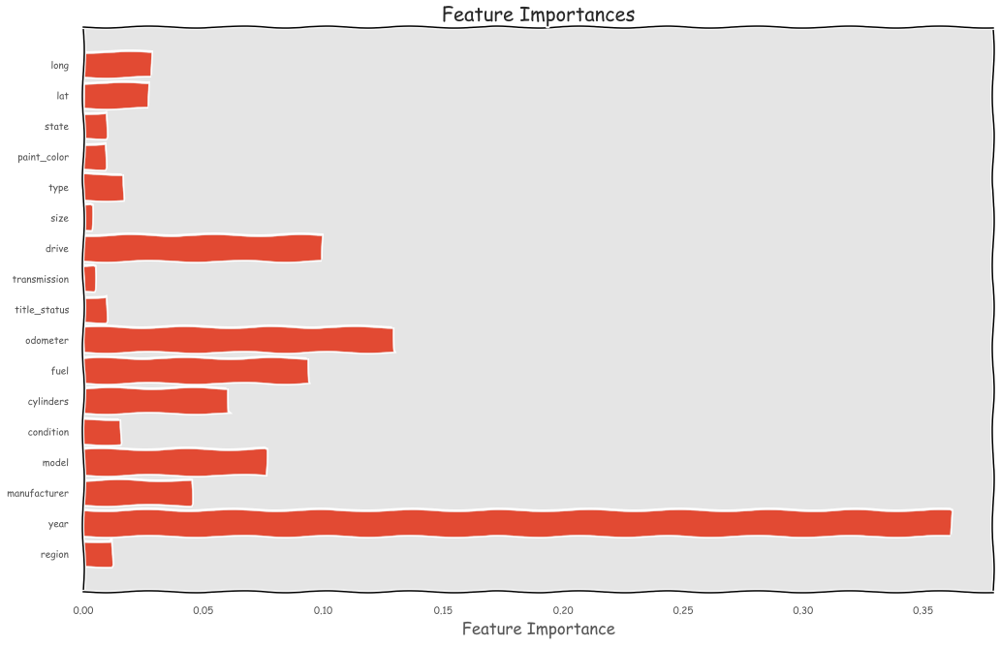

In [70]:
#plt.style.use( 'ggplot')
plt.figure(figsize=(15, 10))
with plt.xkcd():
    plt.barh(X_train.columns, final_model.feature_importances_)
    plt.title("Feature Importances")
    plt.xlabel("Feature Importance")


In [71]:
from collections import defaultdict

In [77]:
a = defaultdict(str)